# STOCK PRICE PREDICTION

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly


In [2]:
import warnings
warnings.filterwarnings('ignore')  # Hide warnings
import datetime as dt
import pandas as pd
pd.core.common.is_list_like = pd.api.types.is_list_like
import pandas_datareader.data as collector
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

In [3]:
#getting the stock data using yahoo finance
start_period = dt.datetime(2012, 1, 1)
end_period = dt.datetime(2021,1,1)
df = collector.DataReader("FB", 'yahoo', start_period, end_period)  # Collects data
#prices in USD


In [4]:
df.head()


,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2012-05-18,45.000000,38.000000,42.049999,38.230000,573576400,38.230000
2012-05-21,36.660000,33.000000,36.529999,34.029999,168192700,34.029999
2012-05-22,33.590000,30.940001,32.610001,31.000000,101786600,31.000000
2012-05-23,32.500000,31.360001,31.370001,32.000000,73600000,32.000000
2012-05-24,33.209999,31.770000,32.950001,33.029999,50237200,33.029999


In [5]:
df.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2020-12-24,270.399994,266.200012,268.880005,267.399994,6702000,267.399994
2020-12-28,277.299988,265.660004,268.739990,277.000000,23299700,277.000000
2020-12-29,280.510010,276.279999,276.950012,276.779999,16383000,276.779999
2020-12-30,278.079987,271.709991,277.950012,271.869995,11803800,271.869995
2020-12-31,277.089996,269.809998,272.000000,273.160004,12900400,273.160004


In [6]:
df.reset_index(inplace=True)


In [7]:
df

,Date,High,Low,Open,Close,Volume,Adj Close
0,2012-05-18,45.000000,38.000000,42.049999,38.230000,573576400,38.230000
1,2012-05-21,36.660000,33.000000,36.529999,34.029999,168192700,34.029999
2,2012-05-22,33.590000,30.940001,32.610001,31.000000,101786600,31.000000
3,2012-05-23,32.500000,31.360001,31.370001,32.000000,73600000,32.000000
4,2012-05-24,33.209999,31.770000,32.950001,33.029999,50237200,33.029999
...,...,...,...,...,...,...,...
2165,2020-12-24,270.399994,266.200012,268.880005,267.399994,6702000,267.399994
2166,2020-12-28,277.299988,265.660004,268.739990,277.000000,23299700,277.000000
2167,2020-12-29,280.510010,276.279999,276.950012,276.779999,16383000,276.779999
2168,2020-12-30,278.079987,271.709991,277.950012,271.869995,11803800,271.869995


In [8]:
data_compacted=df[["Date","Adj Close"]]


In [9]:
data_compacted=data_compacted.rename(columns={"Date": "ds", "Adj Close": "y"})


In [10]:
data_compacted.head()


,ds,y
0,2012-05-18,38.230000
1,2012-05-21,34.029999
2,2012-05-22,31.000000
3,2012-05-23,32.000000
4,2012-05-24,33.029999


In [11]:
data_compacted.tail()


,ds,y
2165,2020-12-24,267.399994
2166,2020-12-28,277.000000
2167,2020-12-29,276.779999
2168,2020-12-30,271.869995
2169,2020-12-31,273.160004


In [12]:
len(data_compacted)

2170

In [13]:
mod = Prophet(daily_seasonality = True)
mod.fit(data_compacted)


In [14]:
future = mod.make_future_dataframe(periods=3650)


In [15]:
forecast = mod.predict(future)


In [16]:
len(forecast)

5820

In [17]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2012-05-18,34.570969,7.750028,34.797735,34.570969,34.570969,-13.931743,-13.931743,-13.931743,-13.802764,...,-0.689156,-0.689156,-0.689156,0.560177,0.560177,0.560177,0.0,0.0,0.0,20.639226
1,2012-05-21,34.653647,6.412878,33.753756,34.653647,34.653647,-14.067413,-14.067413,-14.067413,-13.802764,...,-0.912221,-0.912221,-0.912221,0.647572,0.647572,0.647572,0.0,0.0,0.0,20.586234
2,2012-05-22,34.681206,6.583473,34.560888,34.681206,34.681206,-13.859999,-13.859999,-13.859999,-13.802764,...,-0.713370,-0.713370,-0.713370,0.656136,0.656136,0.656136,0.0,0.0,0.0,20.821207
3,2012-05-23,34.708765,7.483007,34.425323,34.708765,34.708765,-13.697664,-13.697664,-13.697664,-13.802764,...,-0.552373,-0.552373,-0.552373,0.657473,0.657473,0.657473,0.0,0.0,0.0,21.011101
4,2012-05-24,34.736324,7.673429,34.549572,34.736324,34.736324,-13.732882,-13.732882,-13.732882,-13.802764,...,-0.583571,-0.583571,-0.583571,0.653453,0.653453,0.653453,0.0,0.0,0.0,21.003442
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5815,2030-12-25,863.781834,168.802980,1526.180064,181.634854,1548.079784,-16.242982,-16.242982,-16.242982,-13.802764,...,-0.552373,-0.552373,-0.552373,-1.887845,-1.887845,-1.887845,0.0,0.0,0.0,847.538852
5816,2030-12-26,863.941829,161.548867,1530.937016,181.368511,1548.486515,-16.368952,-16.368952,-16.368952,-13.802764,...,-0.583571,-0.583571,-0.583571,-1.982617,-1.982617,-1.982617,0.0,0.0,0.0,847.572877
5817,2030-12-27,864.101823,168.332999,1526.508298,181.119428,1548.893247,-16.555553,-16.555553,-16.555553,-13.802764,...,-0.689156,-0.689156,-0.689156,-2.063633,-2.063633,-2.063633,0.0,0.0,0.0,847.546271
5818,2030-12-28,864.261818,169.847276,1532.748736,180.873504,1549.299978,-14.205929,-14.205929,-14.205929,-13.802764,...,1.725345,1.725345,1.725345,-2.128510,-2.128510,-2.128510,0.0,0.0,0.0,850.055889


In [18]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()


,ds,yhat,yhat_lower,yhat_upper
0,2012-05-18,20.639226,7.750028,34.797735
1,2012-05-21,20.586234,6.412878,33.753756
2,2012-05-22,20.821207,6.583473,34.560888
3,2012-05-23,21.011101,7.483007,34.425323
4,2012-05-24,21.003442,7.673429,34.549572


In [19]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper
5815,2030-12-25,847.538852,168.802980,1526.180064
5816,2030-12-26,847.572877,161.548867,1530.937016
5817,2030-12-27,847.546271,168.332999,1526.508298
5818,2030-12-28,850.055889,169.847276,1532.748736
5819,2030-12-29,850.169223,162.907747,1533.742081


In [20]:
plot_plotly(mod, forecast)

In [21]:
plot_components_plotly(mod, forecast)

In [22]:
df.reset_index(inplace=True)
df.set_index("Date", inplace=True)


Text(0, 0.5, 'Stock Value')

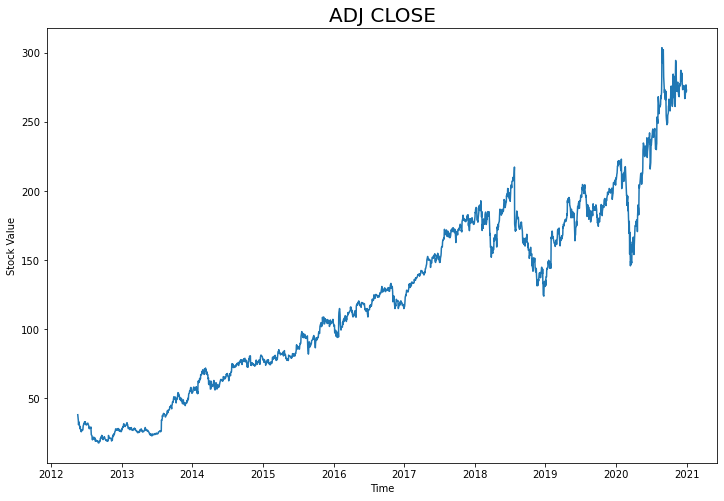

In [23]:
plt.figure(figsize=(12, 8))
plt.plot(df["Adj Close"])
plt.title('ADJ CLOSE', fontsize = 20)
plt.xlabel('Time')
plt.ylabel('Stock Value')

In [24]:
forecast[forecast.ds == '2020-12-31']['yhat']

2169    263.853219
Name: yhat, dtype: float64

In [25]:
data_compacted[data_compacted.ds == '2020-12-31']['y']

2169    273.160004
Name: y, dtype: float64

In [26]:
from prophet.diagnostics import cross_validation
df_cv = cross_validation(mod, initial='750 days', period='180 days', horizon = '365 days')


INFO:prophet:Making 12 forecasts with cutoffs between 2014-07-31 00:00:00 and 2020-01-01 00:00:00


  0%|          | 0/12 [00:00<?, ?it/s]

In [27]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days,223.691786,14.956329,10.610673,0.063890,0.051611,0.065075,0.397351
1,37 days,225.002505,15.000083,10.675684,0.064293,0.053927,0.065471,0.392568
2,38 days,225.653311,15.021761,10.709733,0.064626,0.053927,0.065779,0.389073
3,39 days,224.593993,14.986460,10.666982,0.064460,0.052937,0.065618,0.392384
4,40 days,223.558626,14.951877,10.655270,0.064379,0.053927,0.065519,0.390728


In [28]:
df_p.tail()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
325,361 days,2391.674492,48.904749,37.711179,0.219345,0.204365,0.216026,0.360927
326,362 days,2438.765795,49.383862,38.045332,0.221108,0.204365,0.217299,0.363292
327,363 days,2471.046287,49.709620,38.297170,0.221946,0.203394,0.217900,0.366604
328,364 days,2468.517607,49.684179,38.271772,0.221833,0.203394,0.217630,0.366446
329,365 days,2471.122590,49.710387,38.340827,0.222385,0.201970,0.218055,0.363825


# BITCOIN PRICE PREDICTION


In [29]:
import yfinance as yf

In [30]:
#getting crypto prices
df1 = yf.download('BTC-USD', start = '2016-01-01')

[*********************100%***********************]  1 of 1 completed


In [31]:
df1

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2017-11-09,7446.830078,7446.830078,7101.520020,7143.580078,7143.580078,3226249984
2017-11-10,7173.729980,7312.000000,6436.870117,6618.140137,6618.140137,5208249856
2017-11-11,6618.609863,6873.149902,6204.220215,6357.600098,6357.600098,4908680192
2017-11-12,6295.450195,6625.049805,5519.009766,5950.069824,5950.069824,8957349888
2017-11-13,5938.250000,6811.189941,5844.290039,6559.490234,6559.490234,6263249920
...,...,...,...,...,...,...
2021-12-29,47623.871094,48119.742188,46201.496094,46444.710938,46444.710938,30049226299
2021-12-30,46490.605469,47879.964844,46060.312500,47178.125000,47178.125000,26686491018
2021-12-31,47169.371094,48472.527344,45819.953125,46306.445312,46306.445312,36974172400


In [32]:
df1.reset_index(inplace=True)


In [33]:
df1

,Date,Open,High,Low,Close,Adj Close,Volume
0,2017-11-09,7446.830078,7446.830078,7101.520020,7143.580078,7143.580078,3226249984
1,2017-11-10,7173.729980,7312.000000,6436.870117,6618.140137,6618.140137,5208249856
2,2017-11-11,6618.609863,6873.149902,6204.220215,6357.600098,6357.600098,4908680192
3,2017-11-12,6295.450195,6625.049805,5519.009766,5950.069824,5950.069824,8957349888
4,2017-11-13,5938.250000,6811.189941,5844.290039,6559.490234,6559.490234,6263249920
...,...,...,...,...,...,...,...
1511,2021-12-29,47623.871094,48119.742188,46201.496094,46444.710938,46444.710938,30049226299
1512,2021-12-30,46490.605469,47879.964844,46060.312500,47178.125000,47178.125000,26686491018
1513,2021-12-31,47169.371094,48472.527344,45819.953125,46306.445312,46306.445312,36974172400
1514,2022-01-01,46311.746094,47827.312500,46288.484375,47686.812500,47686.812500,24582667004


In [34]:
data1=df1[["Date","Adj Close"]]


In [35]:
data1=data1.rename(columns={"Date": "ds", "Adj Close": "y"})


In [36]:
data1.head()


,ds,y
0,2017-11-09,7143.580078
1,2017-11-10,6618.140137
2,2017-11-11,6357.600098
3,2017-11-12,5950.069824
4,2017-11-13,6559.490234


In [37]:
data1.tail()

,ds,y
1511,2021-12-29,46444.710938
1512,2021-12-30,47178.125000
1513,2021-12-31,46306.445312
1514,2022-01-01,47686.812500
1515,2022-01-02,47387.843750


In [38]:
len(data1)

1516

In [39]:
m1 = Prophet(daily_seasonality=True)
m1.fit(data1)


In [40]:
future1 = m1.make_future_dataframe(periods=3650)


In [41]:
forecast1 = m1.predict(future1)


In [42]:
forecast1

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2017-11-09,8006.485991,7125.050062,18639.681565,8006.485991,8006.485991,5076.645686,5076.645686,5076.645686,3840.480532,...,-55.683403,-55.683403,-55.683403,1291.848556,1291.848556,1291.848556,0.0,0.0,0.0,13083.131677
1,2017-11-10,7988.268821,7880.183403,18445.644862,7988.268821,7988.268821,4981.332366,4981.332366,4981.332366,3840.480532,...,-5.772790,-5.772790,-5.772790,1146.624623,1146.624623,1146.624623,0.0,0.0,0.0,12969.601187
2,2017-11-11,7970.051651,7367.689429,18075.278315,7970.051651,7970.051651,4868.612698,4868.612698,4868.612698,3840.480532,...,22.637649,22.637649,22.637649,1005.494517,1005.494517,1005.494517,0.0,0.0,0.0,12838.664349
3,2017-11-12,7951.834480,7271.262086,18265.224763,7951.834480,7951.834480,4711.389856,4711.389856,4711.389856,3840.480532,...,1.143244,1.143244,1.143244,869.766079,869.766079,869.766079,0.0,0.0,0.0,12663.224336
4,2017-11-13,7933.617310,7208.541325,18221.598746,7933.617310,7933.617310,4618.565444,4618.565444,4618.565444,3840.480532,...,37.605810,37.605810,37.605810,740.479102,740.479102,740.479102,0.0,0.0,0.0,12552.182754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5161,2031-12-27,152892.557091,-575230.755731,830198.990741,-578447.866952,827344.372881,3498.192364,3498.192364,3498.192364,3840.480532,...,22.637649,22.637649,22.637649,-364.925817,-364.925817,-364.925817,0.0,0.0,0.0,156390.749455
5162,2031-12-28,152920.975717,-573214.743639,829575.940656,-578709.804815,827661.648827,3684.185260,3684.185260,3684.185260,3840.480532,...,1.143244,1.143244,1.143244,-157.438517,-157.438517,-157.438517,0.0,0.0,0.0,156605.160977
5163,2031-12-29,152949.394342,-574882.973857,830459.001605,-578971.742678,827978.924774,3932.723976,3932.723976,3932.723976,3840.480532,...,37.605810,37.605810,37.605810,54.637633,54.637633,54.637633,0.0,0.0,0.0,156882.118318
5164,2031-12-30,152977.812968,-577737.426679,828887.617379,-579233.680541,828296.200721,4077.887443,4077.887443,4077.887443,3840.480532,...,-30.491295,-30.491295,-30.491295,267.898206,267.898206,267.898206,0.0,0.0,0.0,157055.700411


In [43]:
plot_plotly(m1, forecast1)

In [44]:
plot_components_plotly(m1, forecast1)

In [45]:
df1.reset_index(inplace=True)
df1.set_index("Date", inplace=True)



Text(0, 0.5, 'BTC Value')

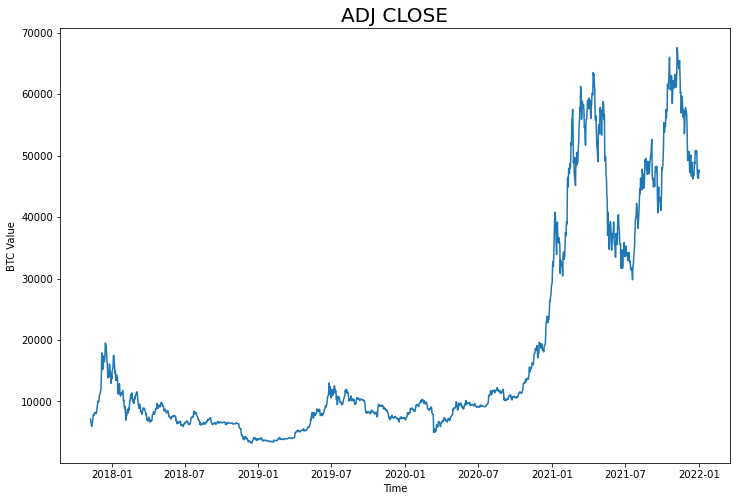

In [46]:
plt.figure(figsize=(12, 8))
plt.plot(df1["Adj Close"])
plt.title('ADJ CLOSE', fontsize = 20)
plt.xlabel('Time')
plt.ylabel('BTC Value')

In [47]:
forecast1[forecast1.ds == '2021-12-23']['yhat']

1505    51767.848646
Name: yhat, dtype: float64

In [48]:
data1[data1.ds == '2021-12-23']['y']

1505    50784.539062
Name: y, dtype: float64

In [49]:
forecast1[['ds', 'yhat', 'yhat_upper', 'yhat_lower']].head()

,ds,yhat,yhat_upper,yhat_lower
0,2017-11-09,13083.131677,18639.681565,7125.050062
1,2017-11-10,12969.601187,18445.644862,7880.183403
2,2017-11-11,12838.664349,18075.278315,7367.689429
3,2017-11-12,12663.224336,18265.224763,7271.262086
4,2017-11-13,12552.182754,18221.598746,7208.541325


In [50]:
forecast1[['ds', 'yhat', 'yhat_upper', 'yhat_lower']].tail()

,ds,yhat,yhat_upper,yhat_lower
5161,2031-12-27,156390.749455,830198.990741,-575230.755731
5162,2031-12-28,156605.160977,829575.940656,-573214.743639
5163,2031-12-29,156882.118318,830459.001605,-574882.973857
5164,2031-12-30,157055.700411,828887.617379,-577737.426679
5165,2031-12-31,157356.094564,834392.161395,-575940.283803


In [60]:
from prophet.diagnostics import cross_validation
df1_cv = cross_validation(m1, initial='1000 days', period='180 days', horizon = '365 days')

INFO:prophet:Making 1 forecasts with cutoffs between 2021-01-02 00:00:00 and 2021-01-02 00:00:00


  0%|          | 0/1 [00:00<?, ?it/s]

In [61]:
from prophet.diagnostics import performance_metrics
df1_p = performance_metrics(df1_cv)
df1_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,36 days,1.938515e+08,13923.055593,13673.007640,0.382415,0.391159,0.474747,0.0
1,37 days,2.076172e+08,14408.928557,14067.441606,0.388406,0.391507,0.484436,0.0
2,38 days,2.221614e+08,14905.078994,14491.537285,0.394950,0.392754,0.494918,0.0
3,39 days,2.333034e+08,15274.270889,14812.634389,0.399799,0.396153,0.502787,0.0
4,40 days,2.464342e+08,15698.223212,15136.865451,0.404051,0.398563,0.510051,0.0


In [62]:
df1_p.tail()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
325,361 days,2.447087e+08,15643.167991,14742.735359,0.284871,0.250999,0.337338,0.694444
326,362 days,2.316823e+08,15221.115063,14335.891783,0.278469,0.249456,0.328443,0.722222
327,363 days,2.170353e+08,14732.118474,13878.389279,0.271374,0.247358,0.318619,0.750000
328,364 days,2.077912e+08,14414.962940,13564.744123,0.266101,0.245275,0.311421,0.777778
329,365 days,1.972253e+08,14043.691956,13216.206323,0.260448,0.242995,0.303667,0.805556
